<a href="https://colab.research.google.com/github/ViniciusSevero/desafio_bemagro/blob/main/Modelo_BEMAGRO_NDVI_DataSet1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Clonando repositório com imagens do desafio

In [1]:
!git clone https://github.com/ViniciusSevero/desafio_bemagro.git

Cloning into 'desafio_bemagro'...
remote: Enumerating objects: 640, done.
remote: Counting objects: 100% (640/640), done.
remote: Compressing objects: 100% (610/610), done.
remote: Total 640 (delta 36), reused 620 (delta 28), pack-reused 0
Receiving objects: 100% (640/640), 30.08 MiB | 9.58 MiB/s, done.
Resolving deltas: 100% (36/36), done.


# Instalando dependências

In [2]:
!pip install rasterio

     |████████████████████████████████| 19.3 MB 1.7 MB/s 


In [3]:
import os

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from os import listdir
from os.path import join, isdir, sep

from imutils import paths

from tqdm import tqdm

from osgeo import gdal
from collections import Counter

%matplotlib inline

from tensorflow.keras.models import Sequential, load_model, model_from_json
from tensorflow.keras.layers import Dense, Conv2D, Dropout, Flatten, MaxPooling2D, Activation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16, ResNet50, VGG19, Xception, InceptionV3
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras import Model, layers
from tensorflow.keras import optimizers

import tensorflow.keras.backend as K
import copy
import cv2
import rasterio

# Definindo o dataset a ser analisado

In [56]:
bemagro_dataset = 'dataset_2'
bemagro_dataset_csv = 'DATASET2.csv'

# Convertendo imagens Raster para JPG

In [57]:
def normalize_array(arr):
  min = np.min(arr[np.nonzero(arr)])
  return ((arr - min) * (1/(arr.max() - min) * 255)).astype('uint8')

In [58]:
def remove_bg(b1, b2, b3):
  bg_pixel_b1 = b1[0][0]
  bg_pixel_b2 = b2[0][0]
  bg_pixel_b3 = b3[0][0]

  print(bg_pixel_b1, bg_pixel_b2, bg_pixel_b3)

  new_b1 = copy.deepcopy(b1)
  new_b2 = copy.deepcopy(b2)
  new_b3 = copy.deepcopy(b3)

  for line in range(len(b1)):
    for column in range(len(b1[line])):
      if(b1[line][column] == bg_pixel_b1 and 
        b2[line][column] == bg_pixel_b2 and 
        b3[line][column] == bg_pixel_b3):
        new_b1[line][column] = 255
        new_b2[line][column] = 255
        new_b3[line][column] = 255

  return (new_b1, new_b2, new_b3)

In [59]:
base_path = "desafio_bemagro/{}/RGB/".format(bemagro_dataset)
new_path = "desafio_bemagro/{}/JPEG/".format(bemagro_dataset)
for fileName in os.listdir(base_path):
  if('.xml' in fileName):
    continue
  dataset = gdal.Open(base_path + fileName)
  if(dataset is None):
    continue

  dataset.GetRasterBand(1).SetColorInterpretation(gdal.GCI_RedBand)
  dataset.GetRasterBand(2).SetColorInterpretation(gdal.GCI_GreenBand)
  dataset.GetRasterBand(3).SetColorInterpretation(gdal.GCI_BlueBand)

  band1 = dataset.GetRasterBand(1)
  band2 = dataset.GetRasterBand(2)
  band3 = dataset.GetRasterBand(3)

  b1 = band1.ReadAsArray()
  b2 = band2.ReadAsArray()
  b3 = band3.ReadAsArray()

  b1 = normalize_array(b1)
  b2 = normalize_array(b2)
  b3 = normalize_array(b3)

  b1, b2, b3 = remove_bg(b1,b2,b3)

  img = np.dstack((b1, b2, b3))
  image = Image.fromarray(np.uint8(img))
  outfile = fileName.split('.')[0] + '.png'
  image.save(new_path + outfile)

84 147 74
34 48 238
125 104 86
224 177 183
205 81 113
101 75 98
92 79 84
61 92 11
13 233 15
67 18 122
59 62 57
221 193 122
70 91 56
73 136 81
3 73 47
92 30 213
50 88 168
72 236 125
50 211 186
147 253 117
65 113 77
106 5 227
81 181 214
158 174 150
228 8 249
45 51 167
101 104 237
104 66 117
169 33 143
252 225 34
189 124 78
21 93 204
91 231 27
35 181 49
120 96 171
21 157 13
223 151 131
138 196 1
146 72 130
149 194 147
225 19 31
88 166 27
218 193 155
48 64 119
163 161 37
131 34 21
123 114 166
222 16 7
123 202 222
137 226 86
135 140 201
175 191 1
212 244 107
118 205 8
249 17 121
191 77 254
98 124 123
109 244 20
121 20 98
80 9 184
33 51 189
220 202 249
145 90 186
244 72 122
120 52 110
34 146 127
162 177 67


# Analisando as imagens NDVI

In [60]:
img_path_ndvi = 'desafio_bemagro/{}/NDVI/2016-07-18.tif'.format(bemagro_dataset)
img_path_png = 'desafio_bemagro/{}/JPEG/2016-07-18.png'.format(bemagro_dataset)
dataset = rasterio.open(img_path_ndvi)
ndvi = dataset.read()
ndvi

array([[[-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        ...,
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.]]],
      dtype=float32)

## Podemos notar outliers nos valores de NDVI da imagem, portanto iremos remover os pixels com valores menores que -1, já que estes representam o fundo da imagem

In [61]:
print(np.min(ndvi))
print(np.max(ndvi))
print(ndvi[ndvi > -1].mean())
np.unique(ndvi)

-9999.0
0.18768328
0.09063452


array([-9.9990000e+03,  4.5729078e-02,  4.6160776e-02, ...,
        1.8190855e-01,  1.8748473e-01,  1.8768328e-01], dtype=float32)

### Imagem RGB em escala de cinza

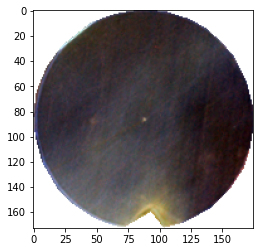

In [62]:
img = cv2.imread(img_path_png, cv2.COLOR_BGR2RGB)
plt.imshow(img, cmap="gray")

### Imagem renderizada com os valores de ndvi

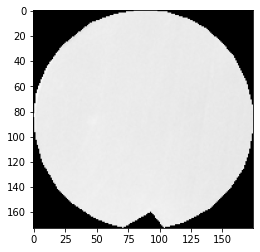

In [63]:
part = ndvi.copy()[0]
part[part < -1] = -1
plt.imshow(part, cmap="gray")

In [64]:
img = cv2.imread(img_path_png, cv2.COLOR_BGR2RGB)
print(img.shape)
print(ndvi.shape)

(173, 175, 3)
(1, 173, 175)


### Recorte da imagem RGB com uma possível mancha de subdesenvolvimento

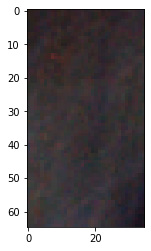

In [65]:
part = img[15:80, 90:125]
plt.imshow(part, cmap="gray")

### Recorte da imagem NDVI com uma possível mancha de subdesenvolvimento

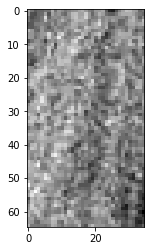

In [66]:
part = ndvi.copy()[0][15:80, 90:125]
part[part < -1] = -1
plt.imshow(part, cmap="gray")

In [67]:
part[10:50][10:15]

array([[0.08530259, 0.09138686, 0.0922853 , 0.09692397, 0.0901086 ,
        0.08630339, 0.08031774, 0.08090615, 0.09101655, 0.09285079,
        0.08667453, 0.09112218, 0.09233906, 0.08584687, 0.08815828,
        0.09483513, 0.09871496, 0.08958273, 0.08979233, 0.08641257,
        0.08411215, 0.0828955 , 0.08440047, 0.08141232, 0.08296943,
        0.08457997, 0.08494869, 0.09381238, 0.09549756, 0.08490293,
        0.08708358, 0.09006121, 0.08651325, 0.07952228, 0.08355016],
       [0.08869565, 0.09471238, 0.09285507, 0.09317852, 0.08709583,
        0.09133082, 0.0878929 , 0.08606558, 0.08468575, 0.08573124,
        0.0904271 , 0.08599941, 0.08233226, 0.08543008, 0.08160852,
        0.07902555, 0.08526682, 0.08640553, 0.08969132, 0.09737609,
        0.08224353, 0.08478513, 0.0883721 , 0.08123904, 0.08152016,
        0.08581236, 0.08617234, 0.09333333, 0.0942957 , 0.08092317,
        0.08081105, 0.08556307, 0.08926488, 0.09194746, 0.08640553],
       [0.09244186, 0.09589832, 0.09184845, 0.

## Criando classificação para o NDVI



*   NDVI < -1 = Fundo da imagem = BRANCO
*   NDVI <= 0 = Objetos Inanimados = PRETO
*   NDVI < 0.33 = Plantas não saudáveis = VERMELHO
*   NDVI < 0.75 = Plantas moderadamento saudáveis = LARANJA
*   NDVI < 1 = Plantas saudáveis = VERDE







In [68]:
def generate_ndvi_colored(ndvi_path, rgb_path):
  img = cv2.imread(rgb_path, cv2.COLOR_BGR2RGB)
  dataset = rasterio.open(ndvi_path)
  ndvi = dataset.read()
  for idx_line, line in enumerate(img):
    for pixel_idx, pixel in enumerate(line):
      ndvi_value = ndvi[0][idx_line][pixel_idx]
      # Fundo
      if(ndvi_value < -1):
        img[idx_line][pixel_idx] = [255, 255, 255]
      # Objetos Inanimados
      elif(ndvi_value <= 0):
        img[idx_line][pixel_idx] = [0, 0, 0]
      # Plantas não saudáveis
      elif(ndvi_value <= 0.33):
        img[idx_line][pixel_idx] = [255, 0, 0]
      # Plantas moderadamente saudáveis
      elif(ndvi_value <= 0.75):
        img[idx_line][pixel_idx] = [255, 150, 51]
      # Saudáveis
      else:
        img[idx_line][pixel_idx] = [0, 255, 0]
  return img

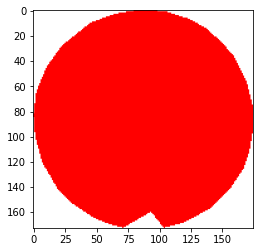

In [69]:
img = generate_ndvi_colored(img_path_ndvi, img_path_png)
plt.imshow(img, cmap="gray")

# Calculando área em pixels dado um limite inferior e superior

In [70]:
def get_total_area_by_threshold(threshold_min, threshold_max, ndvi):
  ndvi_c = ndvi.copy()[0]
  mask = np.zeros((ndvi_c.shape[0], ndvi_c.shape[1], 3))
  cont_area = 0
  for l, line in enumerate(ndvi_c):
    for c, pixel in enumerate(line):
      if(pixel > threshold_min and pixel <= threshold_max):
        mask[l][c] = [0,0,0]
        cont_area += 1
      else:
        mask[l][c] = [255,255,255]
  return (mask, cont_area)

## Área Total

In [71]:
img, area = get_total_area_by_threshold(-1, 1, ndvi)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


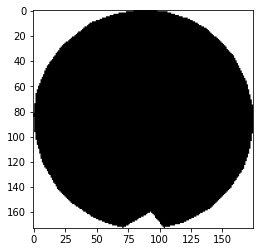

In [72]:
plt.imshow(img, cmap="gray")

In [73]:
print('A área total é {} pixels quadrados'.format(area))

A área total é 23689 pixels quadrados


## Objetos inanimados


In [74]:
img, area = get_total_area_by_threshold(-1, 0, ndvi)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


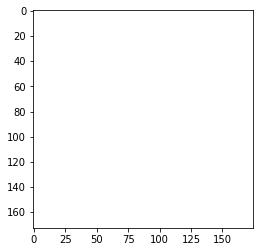

In [75]:
plt.imshow(img, cmap="gray")

In [76]:
print('A área total é {} pixels quadrados'.format(area))

A área total é 0 pixels quadrados


## Plantas não saudáveis

In [77]:
img, area = get_total_area_by_threshold(0, 0.33, ndvi)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


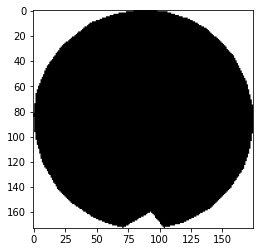

In [78]:
plt.imshow(img, cmap="gray")

In [79]:
print('A área total é {} pixels quadrados'.format(area))

A área total é 23689 pixels quadrados


## Plantas moderadamente saudáveis

In [80]:
img, area = get_total_area_by_threshold(0.33, 0.75, ndvi)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


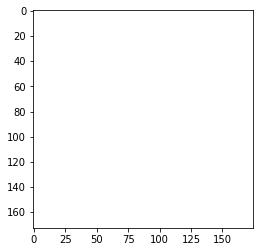

In [81]:
plt.imshow(img, cmap="gray")

In [82]:
print('A área total é {} pixels quadrados'.format(area))

A área total é 0 pixels quadrados


## Plantas saudáveis

In [83]:
img, area = get_total_area_by_threshold(0.75, 1, ndvi)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


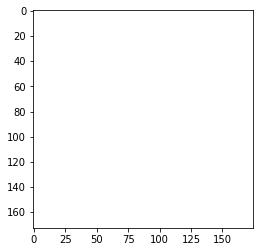

In [84]:
plt.imshow(img, cmap="gray")

In [85]:
print('A área total é {} pixels quadrados'.format(area))

A área total é 0 pixels quadrados


# Processando Dataset e criando features baseadas na classificação NDVI

In [86]:
import pandas as pd
from rasterio import RasterioIOError

In [87]:
def calc_areas(ndvi_path, rgb_path):
  try:
    data = rasterio.open(ndvi_path)
    ndvi = data.read()
    img = cv2.imread(rgb_path, cv2.COLOR_BGR2RGB)
    img1, total_area = get_total_area_by_threshold(-1, 1, ndvi)
    img2, inanimados_area = get_total_area_by_threshold(-1, 0, ndvi)
    img3, plantas_nao_saudaveis_area = get_total_area_by_threshold(0, 0.33, ndvi)
    img4, plantas_moderadamente_saudaveis_area = get_total_area_by_threshold(0.33, 0.75, ndvi)
    img5, plantas_saudaveis_area = get_total_area_by_threshold(0.75, 1, ndvi)
    return ((img1, total_area), 
            (img2, inanimados_area), 
            (img3, plantas_nao_saudaveis_area), 
            (img4, plantas_moderadamente_saudaveis_area), 
            (img5, plantas_saudaveis_area))
  except RasterioIOError:
    return ((pd.NA, pd.NA), 
          (pd.NA, pd.NA), 
          (pd.NA, pd.NA), 
          (pd.NA, pd.NA), 
          (pd.NA, pd.NA))

In [88]:
def calc_ndvi_summary(ndvi_path):
  try:
    data = rasterio.open(ndvi_path)
    ndvi = data.read()
    ndvi = ndvi[ndvi > -1]
    return (ndvi.mean(), np.median(ndvi), np.min(ndvi), np.max(ndvi))
  except RasterioIOError:
    return (pd.NA, pd.NA, pd.NA, pd.NA)

In [89]:
df = pd.read_csv('desafio_bemagro/{}/{}'.format(bemagro_dataset, bemagro_dataset_csv))
df.head()

,temp ano,temp mes,Data,Nublado,Cultura,RGB,NDVI
0,2016,3,2016-03-30,"0,00%",algodao,RGB/2016-03-30.tif,NDVI/2016-03-30.tif
1,2016,4,2016-04-29,"0,00%",algodao,RGB/2016-04-29.tif,NDVI/2016-04-29.tif
2,2016,5,2016-05-19,"0,00%",algodao,RGB/2016-05-19.tif,NDVI/2016-05-19.tif
3,2016,6,2016-06-28,"0,00%",algodao,RGB/2016-06-28.tif,NDVI/2016-06-28.tif
4,2016,7,2016-07-18,"0,00%",colheita,RGB/2016-07-18.tif,NDVI/2016-07-18.tif


In [90]:
total_area = []
inanimados_area = []
plantas_nao_saudaveis_area = []
plantas_moderadamente_saudaveis_area = []
plantas_saudaveis_area = []
ndvi_mean = []
ndvi_median = []
ndvi_min = []
ndvi_max = []

for index, row in df.iterrows():
  base_path = 'desafio_bemagro/{}/'.format(bemagro_dataset)
  rgb_path = base_path + row['RGB'].replace('RGB', 'JPEG').replace('.tif', '.png')
  ndvi_path = base_path + row['NDVI']
  (_, ta), (_, ia), (_, pnsa), (_, pmsa), (_, psa) = calc_areas(ndvi_path, rgb_path)
  total_area.append(ta)
  inanimados_area.append(ia)
  plantas_nao_saudaveis_area.append(pnsa)
  plantas_moderadamente_saudaveis_area.append(pmsa)
  plantas_saudaveis_area.append(psa)

  mean, median, min, max = calc_ndvi_summary(ndvi_path)
  ndvi_mean.append(mean)
  ndvi_median.append(median)
  ndvi_min.append(min)
  ndvi_max.append(max)

df['total_area'] = total_area
df['inanimados_area'] = inanimados_area
df['plantas_nao_saudaveis_area'] = plantas_nao_saudaveis_area
df['plantas_moderadamente_saudaveis_area'] = plantas_moderadamente_saudaveis_area
df['plantas_saudaveis_area'] = plantas_saudaveis_area
df['ndvi_mean'] = ndvi_mean
df['ndvi_median'] = ndvi_median
df['ndvi_min'] = ndvi_min
df['ndvi_max'] = ndvi_max

In [91]:
df.head()

,temp ano,temp mes,Data,Nublado,Cultura,RGB,NDVI,total_area,inanimados_area,plantas_nao_saudaveis_area,plantas_moderadamente_saudaveis_area,plantas_saudaveis_area,ndvi_mean,ndvi_median,ndvi_min,ndvi_max
0,2016,3,2016-03-30,"0,00%",algodao,RGB/2016-03-30.tif,NDVI/2016-03-30.tif,23689,0,152,1715,21822,0.765805,0.780178,0.136236,0.817029
1,2016,4,2016-04-29,"0,00%",algodao,RGB/2016-04-29.tif,NDVI/2016-04-29.tif,23689,0,62,19125,4502,0.693176,0.700483,0.161523,0.800903
2,2016,5,2016-05-19,"0,00%",algodao,RGB/2016-05-19.tif,NDVI/2016-05-19.tif,23689,0,135,23554,0,0.456127,0.454545,0.201725,0.555146
3,2016,6,2016-06-28,"0,00%",algodao,RGB/2016-06-28.tif,NDVI/2016-06-28.tif,23689,0,23689,0,0,0.104196,0.103491,0.063816,0.237561
4,2016,7,2016-07-18,"0,00%",colheita,RGB/2016-07-18.tif,NDVI/2016-07-18.tif,23689,0,23689,0,0,0.090635,0.090061,0.045729,0.187683


## Detectando ciclo de cultura


In [92]:
plantacoes = []
index_to_cut = 0
for index, row in df.iterrows():
  if(row['Cultura'] == 'colheita'):
    plantacoes.append(df.iloc[index_to_cut:index+1])
    index_to_cut = index+1

print(len(plantacoes))
plantacoes[0].head()



11


,temp ano,temp mes,Data,Nublado,Cultura,RGB,NDVI,total_area,inanimados_area,plantas_nao_saudaveis_area,plantas_moderadamente_saudaveis_area,plantas_saudaveis_area,ndvi_mean,ndvi_median,ndvi_min,ndvi_max
0,2016,3,2016-03-30,"0,00%",algodao,RGB/2016-03-30.tif,NDVI/2016-03-30.tif,23689,0,152,1715,21822,0.765805,0.780178,0.136236,0.817029
1,2016,4,2016-04-29,"0,00%",algodao,RGB/2016-04-29.tif,NDVI/2016-04-29.tif,23689,0,62,19125,4502,0.693176,0.700483,0.161523,0.800903
2,2016,5,2016-05-19,"0,00%",algodao,RGB/2016-05-19.tif,NDVI/2016-05-19.tif,23689,0,135,23554,0,0.456127,0.454545,0.201725,0.555146
3,2016,6,2016-06-28,"0,00%",algodao,RGB/2016-06-28.tif,NDVI/2016-06-28.tif,23689,0,23689,0,0,0.104196,0.103491,0.063816,0.237561
4,2016,7,2016-07-18,"0,00%",colheita,RGB/2016-07-18.tif,NDVI/2016-07-18.tif,23689,0,23689,0,0,0.090635,0.090061,0.045729,0.187683


# Plotando imagens de cada ciclo de plantação

## Imagens RGB

In [93]:
culturas = df['Cultura'].unique()

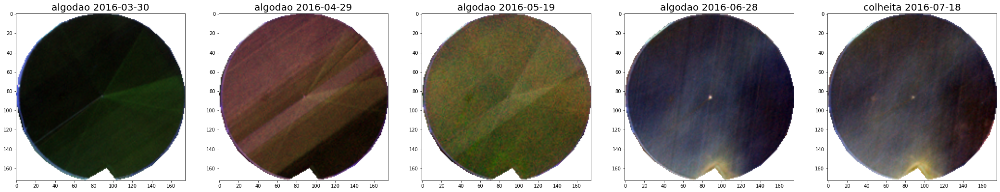

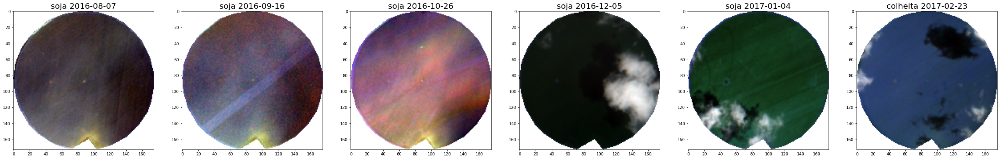

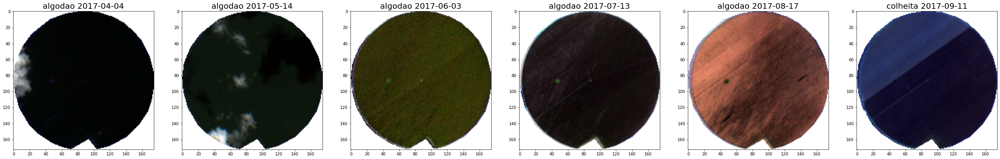

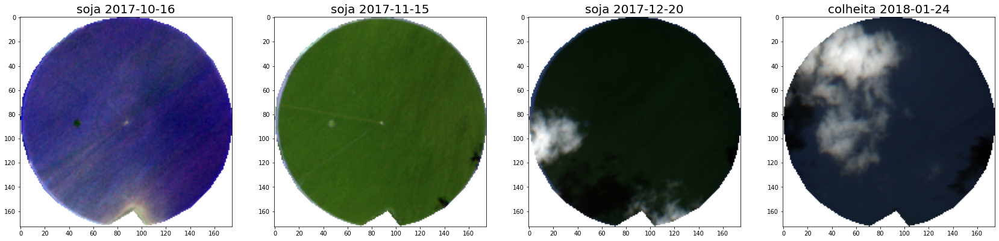

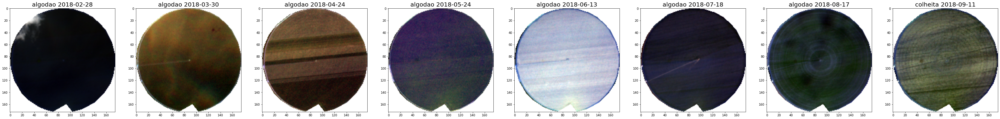

...

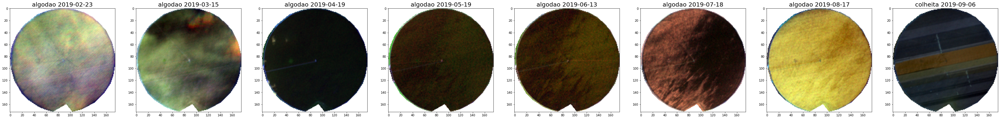

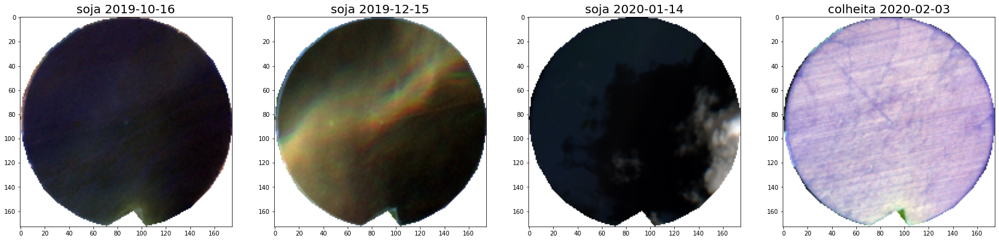

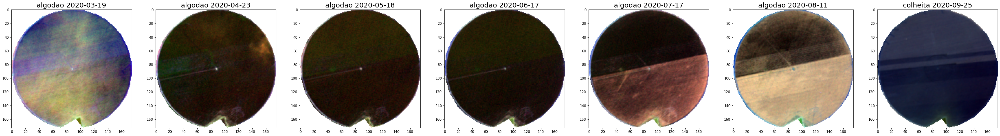

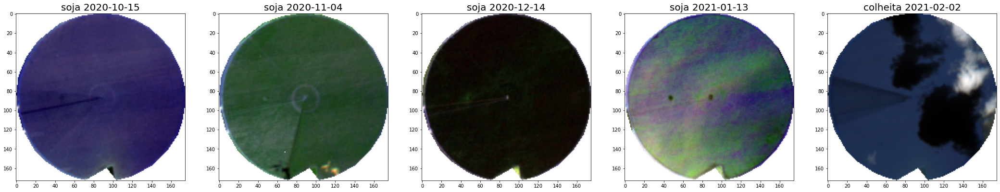

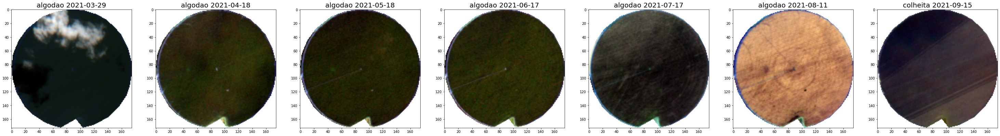

In [94]:
for cultura in plantacoes:
  i = 0
  plt.figure(figsize=(150, 80))
  for index, row in cultura.iterrows():
    base_path = 'desafio_bemagro/{}/'.format(bemagro_dataset)
    rgb_path = base_path + row['RGB'].replace('RGB', 'JPEG').replace('.tif', '.png')
    img_rgb = cv2.imread(rgb_path, cv2.COLOR_BGR2RGB)
    if(img_rgb is not None):
      i += 1
      plt.subplot(3, 20, i)
      plt.title(label = "{} {}".format(row['Cultura'], row['Data']), fontsize=20)
      plt.imshow(img_rgb)
  plt.show()


## Imagens NDVI

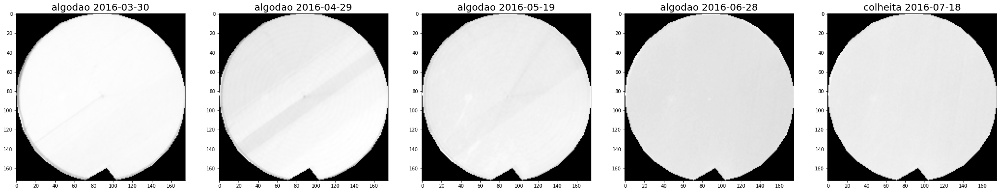

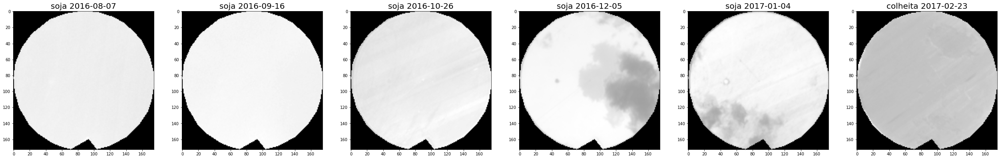

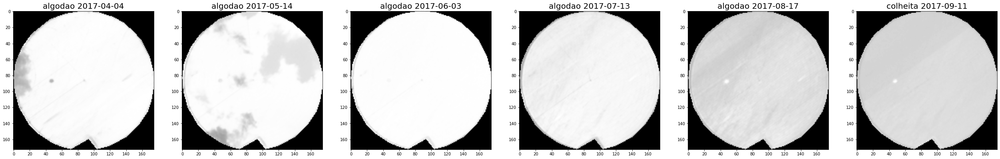

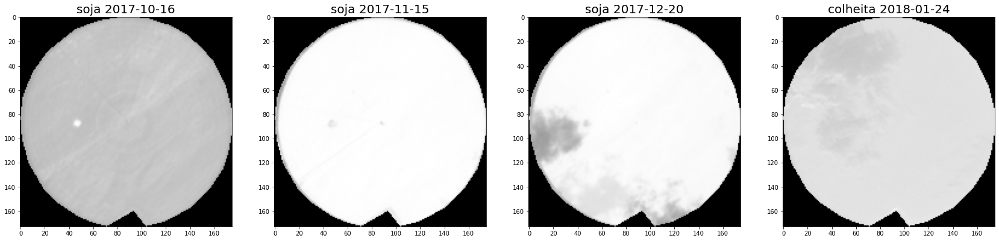

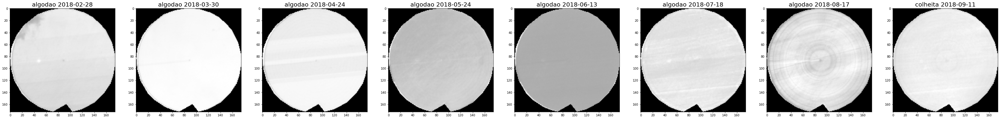

...

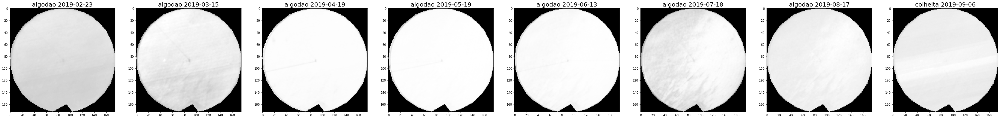

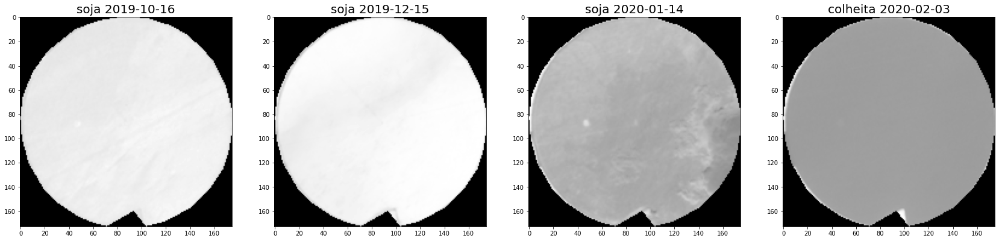

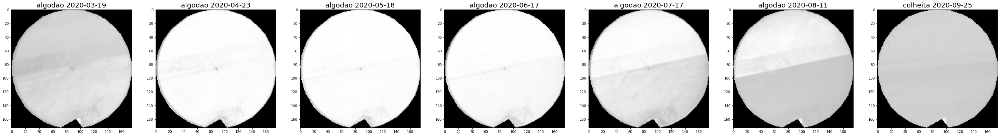

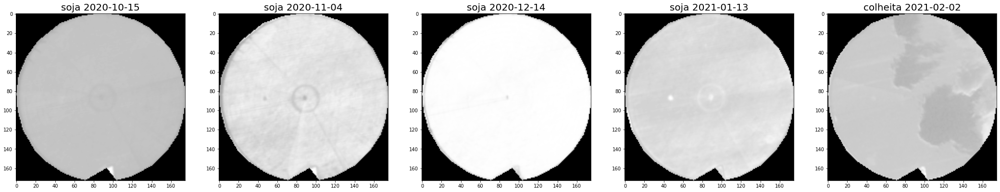

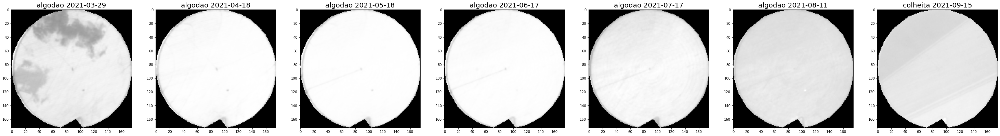

In [95]:
for cultura in plantacoes:
  i = 0
  plt.figure(figsize=(150, 80))
  for index, row in cultura.iterrows():
    try:
      base_path = 'desafio_bemagro/{}/'.format(bemagro_dataset)
      img_path_ndvi = base_path + row['NDVI']
      dataset = rasterio.open(img_path_ndvi)
      ndvi = dataset.read()
      ndvi = ndvi[0]
      ndvi[ndvi < -1] = -1
      i += 1
      plt.subplot(3, 20, i)
      plt.title(label = "{} {}".format(row['Cultura'], row['Data']), fontsize=20)
      plt.imshow(ndvi, cmap="gray")
    except RasterioIOError:
      print('IMG não encontrada')
  plt.show()


## Imagens com áreas de plantas de saúde moderada

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


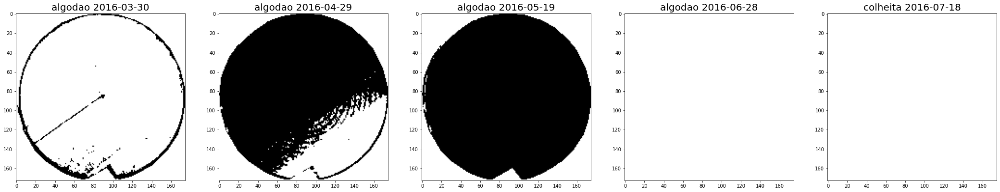

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


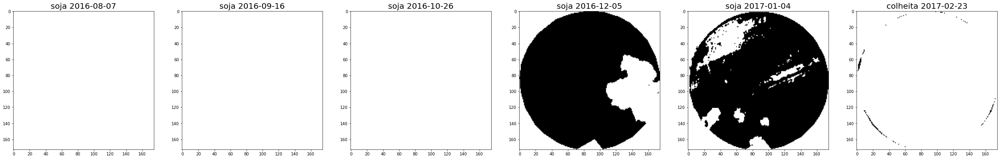

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


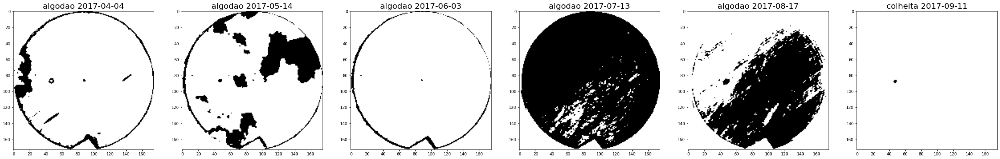

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


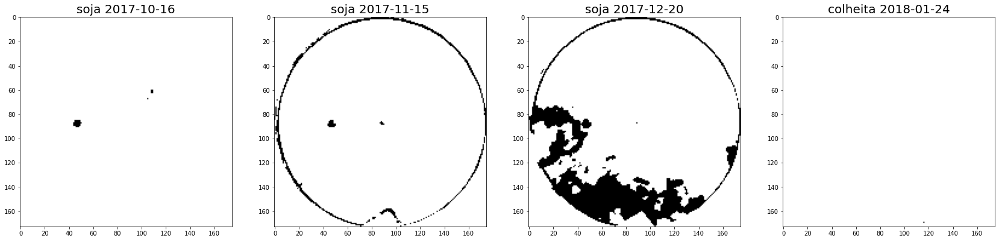

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


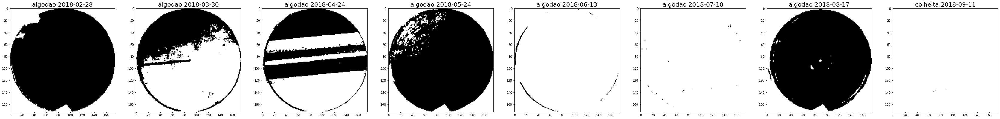

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


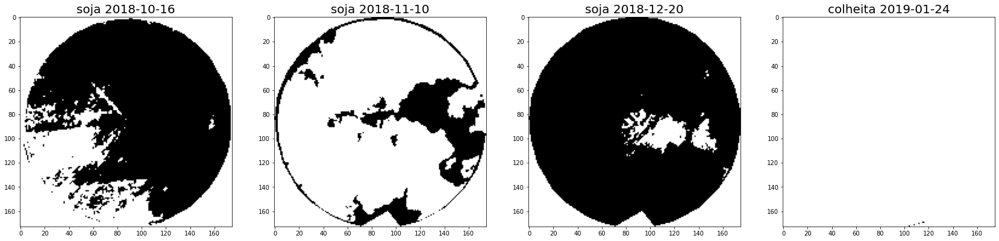

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


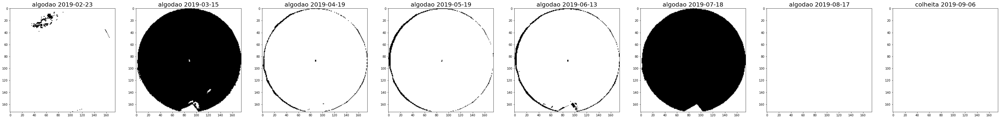

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


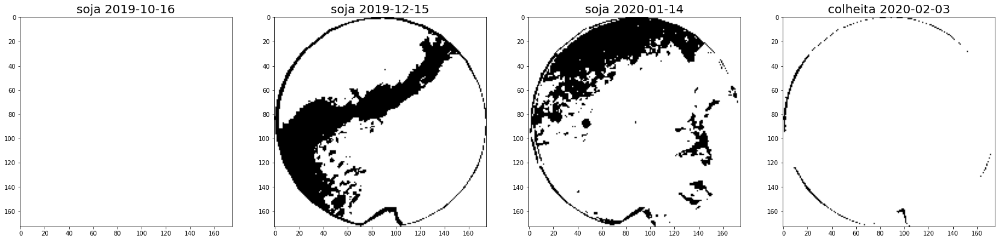

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


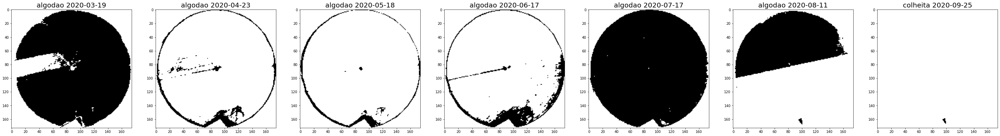

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


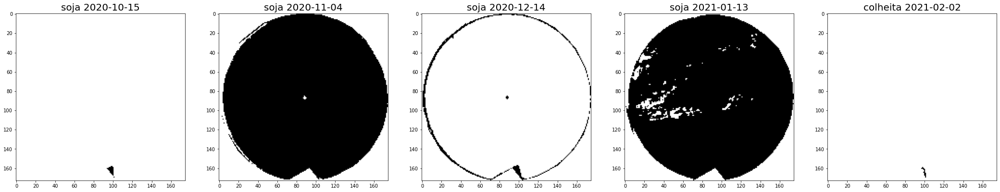

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


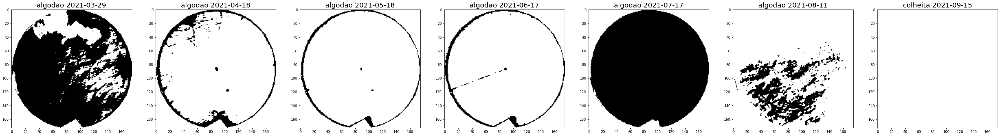

In [96]:
for cultura in plantacoes:
  i = 0
  plt.figure(figsize=(150, 80))
  for index, row in cultura.iterrows():
    base_path = 'desafio_bemagro/{}/'.format(bemagro_dataset)
    rgb_path = base_path + row['RGB'].replace('RGB', 'JPEG').replace('.tif', '.png')
    ndvi_path = base_path + row['NDVI']
    (img_area_total, _), (_, _), (img_nao_saudavel, _), (img_moderadamente_saudavel, _), (_, _) = calc_areas(ndvi_path, rgb_path)
    if(img_moderadamente_saudavel is not pd.NA):
      i += 1
      plt.subplot(3, 20, i)
      plt.title(label = "{} {}".format(row['Cultura'], row['Data']), fontsize=20)
      plt.imshow(img_moderadamente_saudavel, cmap="gray")
  plt.show()
    

## Imagens coloridas de acordo com a classificação NDVI



*   NDVI < -1 = Fundo da imagem = BRANCO
*   NDVI <= 0 = Objetos Inanimados = PRETO
*   NDVI < 0.33 = Plantas não saudáveis = VERMELHO
*   NDVI < 0.75 = Plantas moderadamento saudáveis = LARANJA
*   NDVI < 1 = Plantas saudáveis = VERDE







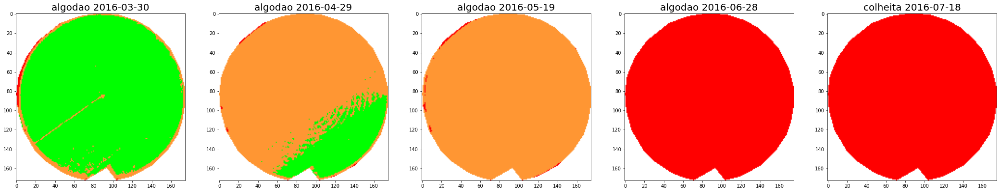

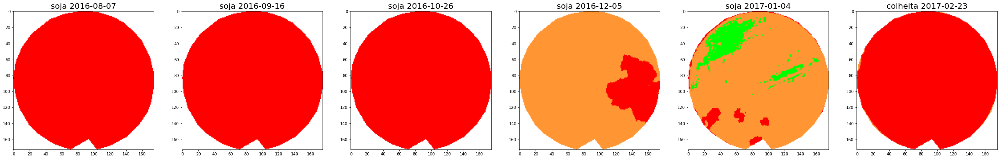

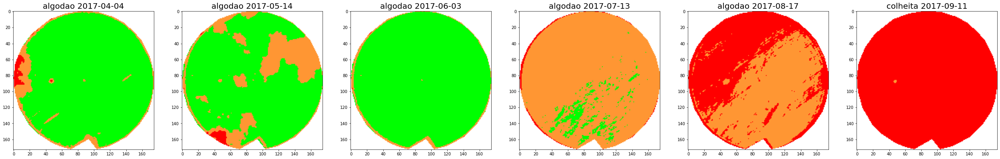

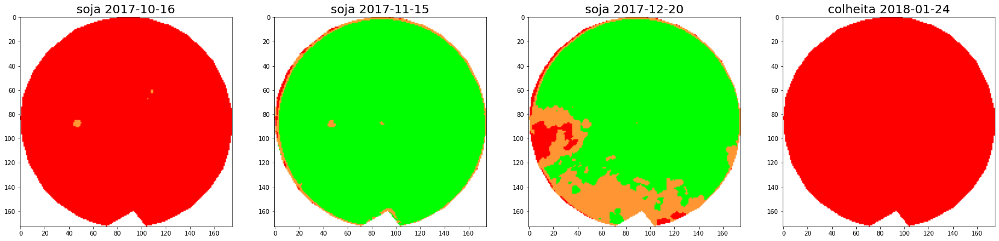

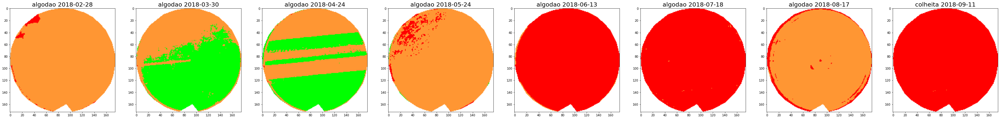

...

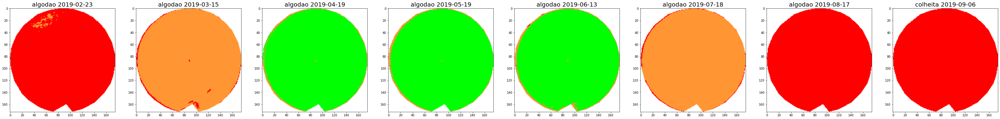

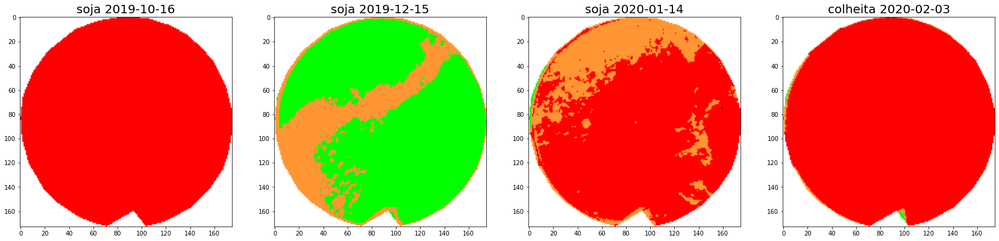

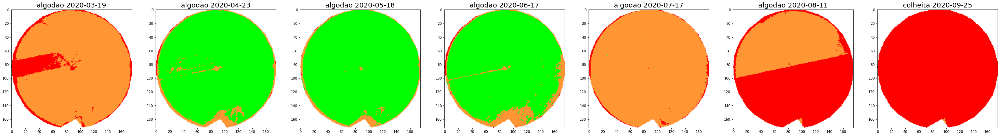

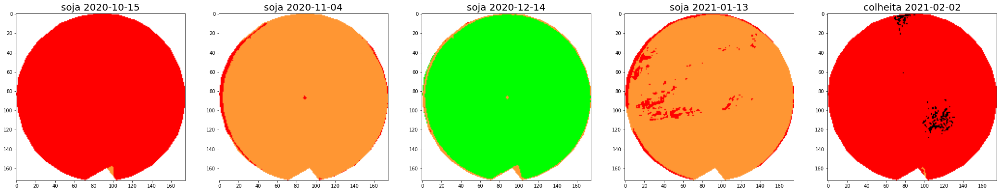

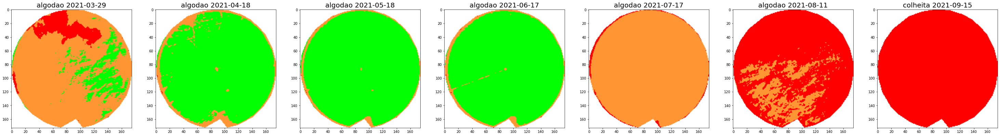

In [97]:
for cultura in plantacoes:
  i = 0
  plt.figure(figsize=(150, 80))
  for index, row in cultura.iterrows():
    try:
      base_path = 'desafio_bemagro/{}/'.format(bemagro_dataset)
      rgb_path = base_path + row['RGB'].replace('RGB', 'JPEG').replace('.tif', '.png')
      ndvi_path = base_path + row['NDVI']
      img = generate_ndvi_colored(ndvi_path, rgb_path)
      i += 1
      plt.subplot(3, 20, i)
      plt.title(label = "{} {}".format(row['Cultura'], row['Data']), fontsize=20)
      plt.imshow(img, cmap="gray")
    except:
      print('não foi encontrada a img: {}'.format(ndvi_path))
  plt.show()

## Verificando ndvi por plantios

In [98]:
plantacoes[0]

,temp ano,temp mes,Data,Nublado,Cultura,RGB,NDVI,total_area,inanimados_area,plantas_nao_saudaveis_area,plantas_moderadamente_saudaveis_area,plantas_saudaveis_area,ndvi_mean,ndvi_median,ndvi_min,ndvi_max
0,2016,3,2016-03-30,"0,00%",algodao,RGB/2016-03-30.tif,NDVI/2016-03-30.tif,23689,0,152,1715,21822,0.765805,0.780178,0.136236,0.817029
1,2016,4,2016-04-29,"0,00%",algodao,RGB/2016-04-29.tif,NDVI/2016-04-29.tif,23689,0,62,19125,4502,0.693176,0.700483,0.161523,0.800903
2,2016,5,2016-05-19,"0,00%",algodao,RGB/2016-05-19.tif,NDVI/2016-05-19.tif,23689,0,135,23554,0,0.456127,0.454545,0.201725,0.555146
3,2016,6,2016-06-28,"0,00%",algodao,RGB/2016-06-28.tif,NDVI/2016-06-28.tif,23689,0,23689,0,0,0.104196,0.103491,0.063816,0.237561
4,2016,7,2016-07-18,"0,00%",colheita,RGB/2016-07-18.tif,NDVI/2016-07-18.tif,23689,0,23689,0,0,0.090635,0.090061,0.045729,0.187683


In [99]:
plantacoes[2]

,temp ano,temp mes,Data,Nublado,Cultura,RGB,NDVI,total_area,inanimados_area,plantas_nao_saudaveis_area,plantas_moderadamente_saudaveis_area,plantas_saudaveis_area,ndvi_mean,ndvi_median,ndvi_min,ndvi_max
11,2017,4,2017-04-04,"3,53%",algodao,RGB/2017-04-04.tif,NDVI/2017-04-04.tif,23689,0,313,2027,21349,0.787319,0.815412,0.165132,0.839973
12,2017,5,2017-05-14,"4,07%",algodao,RGB/2017-05-14.tif,NDVI/2017-05-14.tif,23689,0,253,5520,17916,0.783215,0.834265,0.166580,0.859234
13,2017,6,2017-06-03,"0,00%",algodao,RGB/2017-06-03.tif,NDVI/2017-06-03.tif,23689,0,6,933,22750,0.820458,0.828571,0.274472,0.842408
14,2017,7,2017-07-13,"0,00%",algodao,RGB/2017-07-13.tif,NDVI/2017-07-13.tif,23689,0,378,21929,1382,0.698300,0.719224,0.117155,0.798442
15,2017,8,2017-08-17,"0,00%",algodao,RGB/2017-08-17.tif,NDVI/2017-08-17.tif,23689,0,10862,12827,0,0.329115,0.336698,0.075321,0.546675
16,2017,9,2017-09-11,"0,01%",colheita,RGB/2017-09-11.tif,NDVI/2017-09-11.tif,23689,0,23676,13,0,0.218481,0.227733,0.054358,0.435696


In [100]:
plantacoes[4]

,temp ano,temp mes,Data,Nublado,Cultura,RGB,NDVI,total_area,inanimados_area,plantas_nao_saudaveis_area,plantas_moderadamente_saudaveis_area,plantas_saudaveis_area,ndvi_mean,ndvi_median,ndvi_min,ndvi_max
21,2018,2,2018-02-28,"2,39%",algodao,RGB/2018-02-28.tif,NDVI/2018-02-28.tif,23689,0,351,23338,0,0.518693,0.526618,0.147388,0.718434
22,2018,3,2018-03-30,"0,00%",algodao,RGB/2018-03-30.tif,NDVI/2018-03-30.tif,23689,0,3,9244,14442,0.748917,0.756834,0.290650,0.789219
23,2018,4,2018-04-24,"0,00%",algodao,RGB/2018-04-24.tif,NDVI/2018-04-24.tif,23689,0,10,11946,11733,0.752731,0.748413,0.253377,0.860837
24,2018,5,2018-05-24,"0,00%",algodao,RGB/2018-05-24.tif,NDVI/2018-05-24.tif,23689,0,1143,22502,44,0.416650,0.419477,0.130360,0.823585
25,2018,6,2018-06-13,"0,00%",algodao,RGB/2018-06-13.tif,NDVI/2018-06-13.tif,23689,0,23407,282,0,0.162466,0.156823,0.074541,0.712607
26,2018,7,2018-07-18,"0,00%",algodao,RGB/2018-07-18.tif,NDVI/2018-07-18.tif,23689,0,23647,42,0,0.221659,0.221151,0.046875,0.362124
27,2018,8,2018-08-17,"0,00%",algodao,RGB/2018-08-17.tif,NDVI/2018-08-17.tif,23689,0,1402,22287,0,0.467239,0.478237,0.057925,0.666984
28,2018,9,2018-09-11,"0,00%",colheita,RGB/2018-09-11.tif,NDVI/2018-09-11.tif,23689,0,23686,3,0,0.239425,0.242710,0.079727,0.336806


In [101]:
plantacoes[6]

,temp ano,temp mes,Data,Nublado,Cultura,RGB,NDVI,total_area,inanimados_area,plantas_nao_saudaveis_area,plantas_moderadamente_saudaveis_area,plantas_saudaveis_area,ndvi_mean,ndvi_median,ndvi_min,ndvi_max
33,2019,2,2019-02-23,"0,00%",algodao,RGB/2019-02-23.tif,NDVI/2019-02-23.tif,23689,0,23434,255,0,0.243834,0.245721,0.090103,0.447664
34,2019,3,2019-03-15,"0,00%",algodao,RGB/2019-03-15.tif,NDVI/2019-03-15.tif,23689,0,509,23180,0,0.507130,0.526421,0.095398,0.650401
35,2019,4,2019-04-19,"0,00%",algodao,RGB/2019-04-19.tif,NDVI/2019-04-19.tif,23689,0,0,647,23042,0.847502,0.856941,0.336576,0.879938
36,2019,5,2019-05-19,"0,00%",algodao,RGB/2019-05-19.tif,NDVI/2019-05-19.tif,23689,0,3,716,22970,0.840613,0.847270,0.273279,0.861637
37,2019,6,2019-06-13,"0,00%",algodao,RGB/2019-06-13.tif,NDVI/2019-06-13.tif,23689,0,17,925,22747,0.809188,0.816048,0.221977,0.845416
38,2019,7,2019-07-18,"0,00%",algodao,RGB/2019-07-18.tif,NDVI/2019-07-18.tif,23689,0,399,23290,0,0.611271,0.617744,0.092162,0.735533
39,2019,8,2019-08-17,"0,00%",algodao,RGB/2019-08-17.tif,NDVI/2019-08-17.tif,23689,0,23689,0,0,0.244389,0.241957,0.070899,0.314327
40,2019,9,2019-09-06,"0,01%",colheita,RGB/2019-09-06.tif,NDVI/2019-09-06.tif,23689,0,23689,0,0,0.206309,0.198563,0.071313,0.287651


## Detectando áreas de subdesenvolvimento recorrente por plantação

In [102]:
def detecta_subdesenvlimento_por_plantacao(cultura):
  imgs = []
  pixels_subdesenvolvimento = []
  for index, row in cultura.iterrows():
    try:
      base_path = 'desafio_bemagro/{}/'.format(bemagro_dataset)
      ndvi_path = base_path + row['NDVI']
      dataset = rasterio.open(ndvi_path)
      ndvi = dataset.read()
      imgs.append(ndvi[0])
    except:
      print('não foi encontrada a img: {}'.format(ndvi_path))
  for l, line in enumerate(imgs[0]):
    for c, ndvi_value in enumerate(line):
      if(ndvi_value >= -1 and ndvi_value < 0.75):
        eh_subdesenvolvido = True
        for img in imgs:
          if img[l][c] >= 0.75:
            eh_subdesenvolvido = False
            break
        if(eh_subdesenvolvido == True):
          pixels_subdesenvolvimento.append((l,c))
  regiao_subdesenvlvimento = np.zeros((imgs[0].shape[0],imgs[0].shape[1])) + 255
  for l, c in pixels_subdesenvolvimento:
    regiao_subdesenvlvimento[l][c] = 0
  return (len(pixels_subdesenvolvimento), regiao_subdesenvlvimento)
        


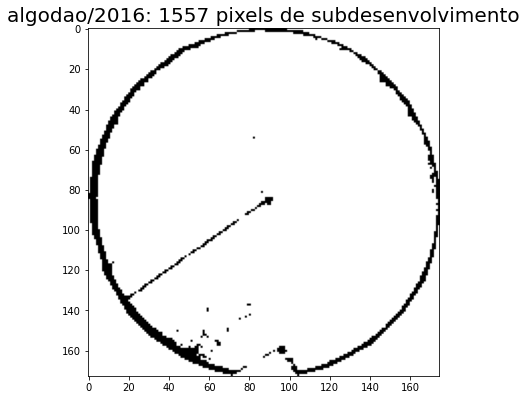

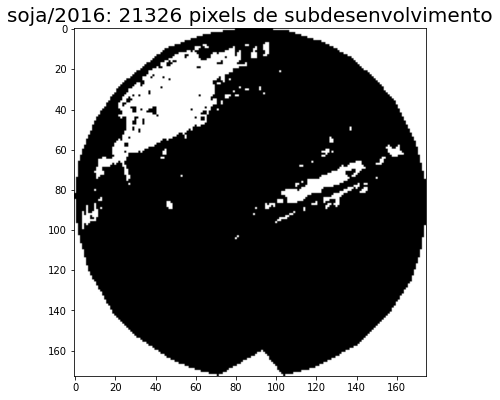

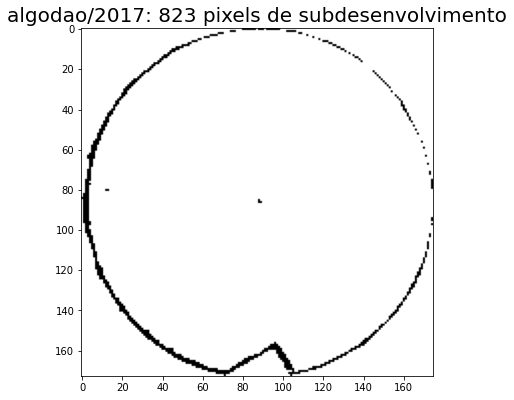

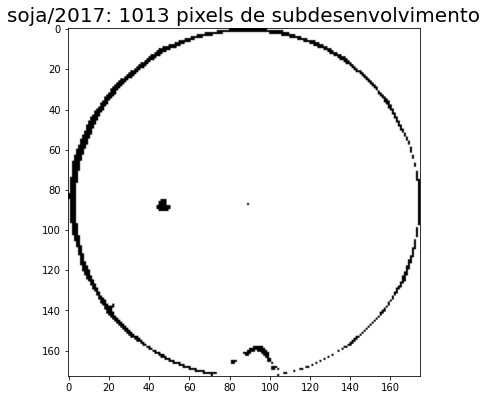

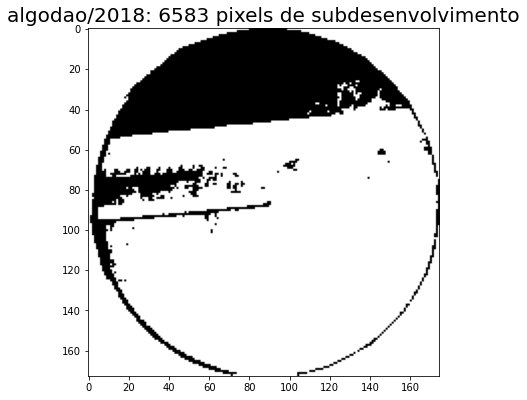

...

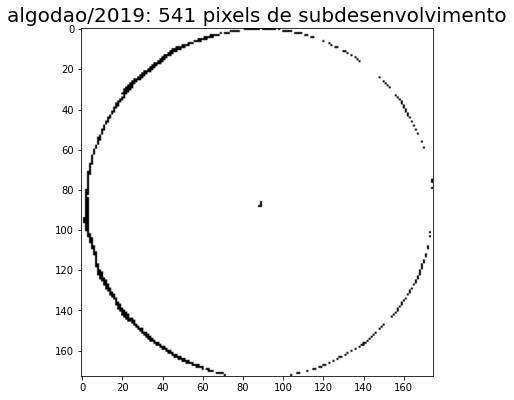

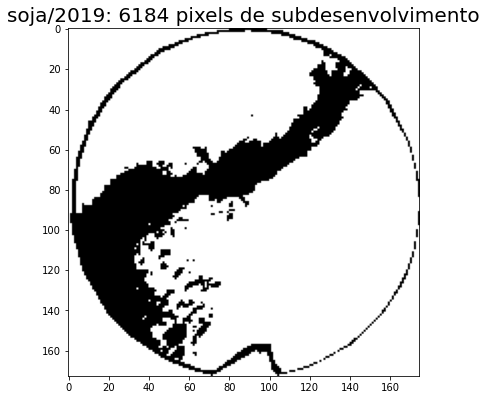

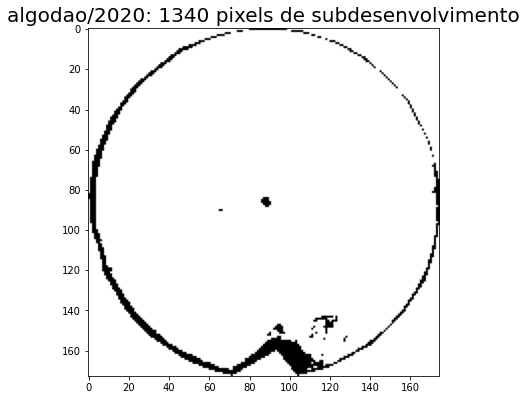

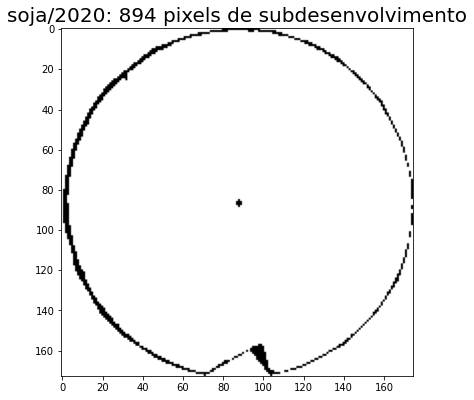

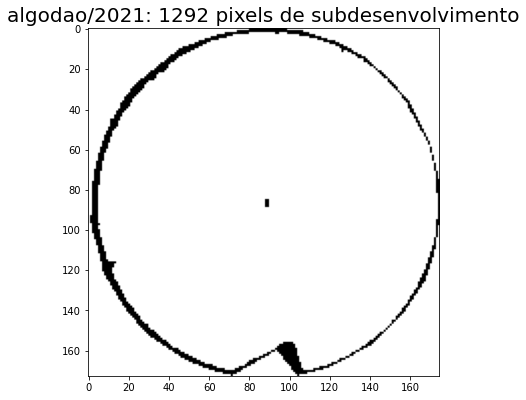

In [103]:
for index, cultura in enumerate(plantacoes):
  plt.figure(figsize=(150, 80))
  qtd_pixels_sub, regiao_subdesenvlvimento = detecta_subdesenvlimento_por_plantacao(cultura)
  plt.subplot(3, 20, index + 1)
  row = cultura.iloc[0]
  plt.title(label = "{}/{}: {} pixels de subdesenvolvimento".format(row['Cultura'], row['temp ano'], qtd_pixels_sub), fontsize=20)
  plt.imshow(regiao_subdesenvlvimento, cmap="gray")